# Livrable 2 - Traitement d'images

Le but de ce livrable est de traiter un ensemble de photographies afin de les rendre plus traitables par les algorithmes de Machine Learning.

## Prétraitement et Importation

Dans un premier temps, nous importons les bibliothèques necessaires. 
TensorFlow est une bibliothèque permettant de standardiser et de simplifier la création et le déploiement de modèles en deep learning.
Numpy permet d’effectuer rapidement et efficacement des opérations. Les tableaux NumPy utilisent moins de mémoire et d’espace de stockage que les tableaux traditionnels de python.
Matplotlib est utilisée pour créer des graphiques et des diagrammes de haute qualité.

In [ ]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt

Pour importer nos images nous avons choisis d'utiliser google drive.

In [ ]:
from google.colab import drive #SI LANCé SUR GOOGLE COLAB
drive.mount('/content/drive') #SI LANCé SUR GOOGLE COLAB



mypath = "/content/drive/MyDrive/Dataset" # INSERER LIEN ABSOLU VERS LE DOSSIER LIVRABLE 2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Suppression des images corrompues et importation équilibrée des données

Dans notre cadre, nous définissons les images corrompues comme tout fichier non conformément encodé. Selon Keras, il est possible d'identifier une image corrompue si la chaine de caratcères "JFIF" n'est pas présente dans son header. Après avoir executé notre code, on ne trouve pas d'image corrompue.

In [ ]:
import os


#FILTRE D'IMAGES CORROMPUES
num_skipped = 0
filenames = next(os.walk(mypath), (None, None, []))[2]  # [] if no file
width = []
height = []
for filename in filenames : 
    try:
        fobj = open(mypath+'/'+filename, "rb")
        is_jfif = tf.compat.as_bytes("JFIF") in fobj.peek(10)
    finally:
        fobj.close()

    if not is_jfif:
        num_skipped += 1
        os.remove(mypath+'/'+filename)

print("Deleted %d images" % num_skipped)


Deleted 0 images


## Dimensions des images

Le choix des dimensions des images est assez délicat. La dimension sera un paramètre responsable de la qualité finale des images. Elle doit être divisable minimum par 8 pour avoir un modèle comprenant maximum 3 couches sans risquer d'avoir un chiffre a virgule arrondi, ce qui affectera la forme de sortie du  modèle. Aussi, étant donné que nous travaillons avec des images de grande taille, réduire trop l'image effacerait ses détails au risque de ne plus pouvoir comprendre les éléments et caractéristiques de l'image et d'obtenir des images très floutées en sortie du modèle. C'est pourquoi nous avons opté pour un chiffre proche de la moyenne de la largeur et la longueur des images de notre dataset.

In [ ]:
import tensorflow as tf
import keras
import cv2
import os

#CALCUL DES DIMENSIONS MOYENNES
filenames = next(os.walk(mypath), (None, None, []))[2]  # [] if no file
width = []
height = []
for filename in filenames : 
  image = cv2.imread(mypath+'/'+filename)
  width.append(image.shape[0])
  height.append(image.shape[1])

widthMean = sum(width) / len(width) 
print("width mean : "+ str(widthMean))
heightMean = sum(height) / len(height)
print("height mean : "+ str(heightMean))

width mean : 480.75333333333333
height mean : 583.22


500 est le multiple de 100 le plus proche de chacune des valeurs, malheureusement il est pas divisable par 8, nous avons décidés de choisir une dimension de 400x400 afin qu'on puisse expérimenter les modèles à 3 couches cachées. Enfin, il est très probable que nous soyons dans l'obligation de redimensionner les images en 299x299 pour le reste du workflow. Alors que ni 299, ni 300 n'est divisible par 8, choisir 200 aurait risqué de perdre trop de détails sur les images

In [ ]:
widthMean = 400 
print("width mean : "+ str(widthMean))
heightMean = 400
print("height mean : "+ str(heightMean))

width mean : 400
height mean : 400


### Importation des images et defloutage 

Enfin nous importons les images, les defloutons, les redimensionnons, et les transformons en tableau à 3 dimensions, une pour chaque couleur de RGB.

Le masquage flou (USM) est une technique de netteté d'image, il est couramment utilisée dans les logiciels de traitement d'images.
C'est une technique de traitement utilisé pour rendre les images plus nettes. 

Le masquage flou consiste en deux étapes : 


*   On obtient le Laplacien de l'image
*   On enleve le laplacien de l'image originale 

Nous allons utiliser un filtre median qui permettra de preserver les contours, ils reduit le bruit tout en preservant les ppreservant. Il est necessaire car le filtre laplacien a tendance a amplifier le bruit dans les images. 

Le calcul du Laplacien d'une image est essentiellement un detecteur de bord. Les régions lisses d'une image ont un très petit laplacien. Les arretes et les interfaces ont un grand Laplacien (positif ou negatif).

La variable sigma sert à controler l'action du filtre median, la strength elle sert à definir la quantiter de laplacien que nous voulons ajouter ou supprimer.
Si nous choisissons une valeur negative pour strength nous allons ajouter du flou, si elle est positive nous reduisons le flou de l'image. 

150

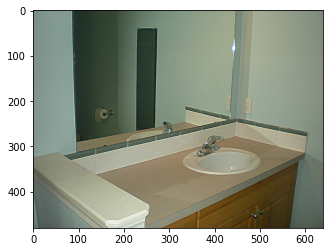

In [ ]:
from os import walk
from matplotlib import image
from matplotlib import pyplot
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage.filters import median_filter
import numpy as np

#IMPORTATION DES IMAGES + RESIZE + DEFLOUTAGE

def unsharp(image, sigma, strength):
    image_mf = median_filter(image, sigma)
    lap = cv2.Laplacian(image_mf,cv2.CV_64F)
    sharp = image-strength*lap
    sharp[sharp>255] = 255
    sharp[sharp<0] = 0
  
    return sharp

filenames = next(walk(mypath), (None, None, []))[2]  # [] if no file
dataset = []
for filename in filenames : 
  img = cv2.imread(mypath+'/'+filename)
  grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  var = cv2.Laplacian(grey, cv2.CV_64F).var()
  if var < 120:
    original_image = plt.imread(mypath+'/'+filename)
    sharp1 = np.zeros_like(original_image)
    for i in range(3):
      sharp1[:,:,i] = unsharp(original_image[:,:,i], 5, 2)
      grey = cv2.cvtColor(sharp1, cv2.COLOR_BGR2GRAY)
      var = cv2.Laplacian(grey, cv2.CV_64F).var()
    dataset.append(cv2.resize(sharp1,dsize=(widthMean,heightMean)))
  else:
    dataset.append(cv2.resize(image.imread(mypath+'/'+filename),dsize=(widthMean,heightMean)))

dataset = np.array(dataset)
len(dataset)

In [ ]:
from os import walk
from matplotlib import image
from matplotlib import pyplot
import cv2

#IMPORTATION DES IMAGES + RESIZE
filenames = next(walk(mypath), (None, None, []))[2]  # [] if no file
dataset = []
for filename in filenames : 
  dataset.append(cv2.resize(image.imread(mypath+'/'+filename),dsize=(widthMean,heightMean))) 
dataset = np.array(dataset)

Pour pouvoir bien entrainer notre modèle nous devons diviser notre dataset en partie d'entrainement et en partie test.
Nous allons entrainer notre modèle avec la partie train et verifier nos resultats avec la partie test. 
Nous allouons 20% de notre dataset à la partie test et 80% à notre partie train.

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
x_train, x_test = train_test_split(dataset, test_size=0.2, random_state=42)
print(len(x_train))
print(len(x_test))

120
30


Et nous normalisons les données du dataset afin d'avoir des valeurs entre 0 et 1.

In [ ]:
x_train = np.divide(x_train, 255)
x_test = np.divide(x_test, 255)
print(x_train[0][0][0])

[0.56078431 0.23921569 0.01960784]


## Modèle de l'Autoencoder

### Premier test

Nous avons donc 120 images pour entrainer notre modèle et 30 pour le tester.  

L'auto-encodeur est un réseau de neurones artificiels non supervisé qui apprend à compresser et à encoder efficacement les données, puis à reconstruire les données avec une représentation aussi proche que possible de l'entrée d'origine.

Il permet de réduire les dimensions des données en apprenant à ignorer le bruit dans les données.

L'autoencodeur est composé de trois parties:

*   Encodeur : Il va comprimer les données d'entrée de l'ensemble de train-validation-test en une représentation codée.
*   Espace latent : Elle contient les données compressées c'est la partie la plus importante du réseau.
*   Decodeur : Il va permettre de decompresser les données à partir de leur forme codée. 


Pour notre encodeur nous avons dans un premier temps utilisé des couches Conv2D et MaxPooling.
La couche Conv2D pour faire ressortir les pixels importants de l'image. Cette couche est nécessaire pour determiner les contours d'une image et attenuer le bruit. Elle ajoute plus de dimensions selon le nombre envoyé en paramètres, ce qui représente la quantité d'informations captées par la couche.
La couche MaxPooling2D est un type d'opération qui est ajouté suivant une couche convolutive. Lorsqu'elle est ajoutée à un modèle, elle réduit la dimension des images en réduisant le nombre de pixels dans la sortie de la couche convolutive précédente. Il ne choisit que la valeur la plus haute de la matrice qu'il analyse, cadre par cadre.

*   La première couche aura 16 filtres de taille 3 x 3, suivi d'une couche de sous-échantillonnage (MaxPooling2D)
*   La deuxième couche aura 32 filtres de taille 2 x 2, suivi d'une autre couche de sous-échantillonnage



Dans un premier temps nous avons donc utilisé deux couches de Conv2D et deux couches de MaxPooling2d dans l'encodeur. 

In [ ]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D

input_img = Input(shape=(heightMean,widthMean,3))

# Encodeur #
x = Conv2D(16, (3,3), activation="relu", padding ='same')(input_img)
x = MaxPooling2D((2,2), padding='same')(x)
x = Conv2D(32, (2,2), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2,2), padding='same')(x)

Pour le decodeur nous allons aussi utiliser une couche conv2D et UpSampling qui permet d'augmenter la taille de l'image à l'aide d'une matrice. La couche UpSampling va permettre de retrouver la taille initiale de nos image et donc de retrouver une image decompréssée.



*    La première couche aura 32 filtres de taille 2 x 2 suivis d'une couche de suréchantillonnage (UpSampling2D)
*   La deuxième couche aura 16 filtres de taille 3 x 3 suivis d'une autre couche de suréchantillonnage (UpSampling2D)


In [ ]:
# Decodeur #
x = Conv2D(32, (2,2), activation='relu', padding='same')(encoded)
x = UpSampling2D((2,2))(x)
x = Conv2D(16, (3,3), activation="relu", padding ='same')(x)
x = UpSampling2D((2,2))(x)
decoded = Conv2D(3, (3, 3), activation= "sigmoid", padding="same")(x)

La fonction de perte est celle que nous utilisons pour former l'auto-encodeur, comme nous travaillons avec des données d'image est la fonction de perte la plus populaire pour la reconstruction :

*   la MSE(meanSquaredError)

L'erreur quadratique moyenne (MSE) entre les deux images est la somme de la différence au carré entre les deux images. Les deux images doivent avoir la même dimension

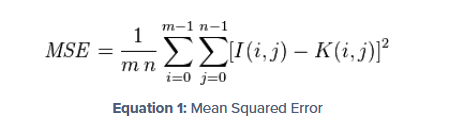

[source](https://www.v7labs.com/blog/autoencoders-guide#:~:text=The%20loss%20function%20used%20to,been%20reconstructed%20from%20the%20input)

Comme nous voulons former notre réseau de neurones en moins de temps possible et le plus efficacement l'optimiseur que nous devons utiliser est :

*   Adam

[source](https://towardsdatascience.com/optimizers-for-training-neural-network-59450d71caf6#:~:text=Adam%20is%20the%20best%20optimizers,descent%20is%20the%20best%20option)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 400, 400, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 200, 200, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 32)      2080      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 100, 100, 32)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 100, 100, 32)      4128  

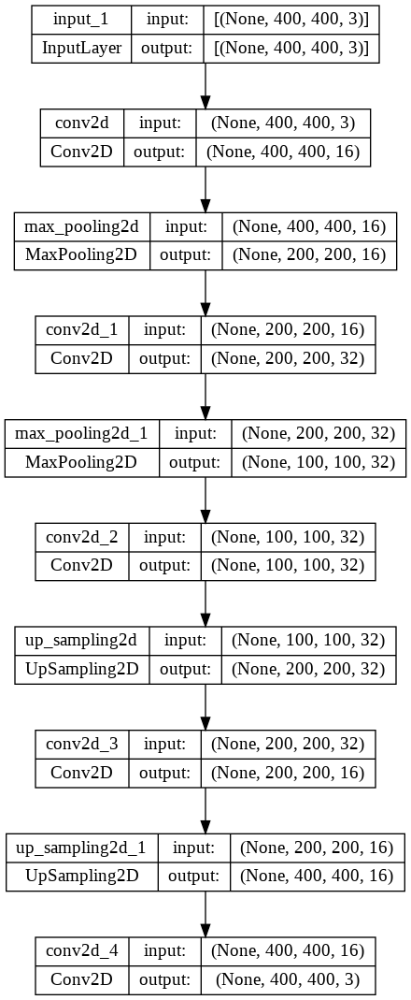

In [ ]:
from keras.utils.vis_utils import plot_model
from keras.models import Model

autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(loss='mean_squared_error', optimizer = 'adam')
autoencoder.summary()
plot_model(autoencoder, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

### Batch Size & Epochs

Il est recommandé d'adapter son nombre d'époque et la taille de son batch selon les performances qui nous sont données (RAM & CPU/GPU). Aussi, les valeurs les plus populaires sont 100 époques et entre 30 et 256 en taille de batch lorsqu'on possède des performances standards. Ici, nous allons débuter avec 100 époques et une taille de batch de 30.

[source](https://stackoverflow.com/questions/35050753/how-big-should-batch-size-and-number-of-epochs-be-when-fitting-a-model)

In [ ]:
# Configurations principales de nos modèles
            
NB_EPOCHS = 100              
BATCH_SIZE= 30               

history = autoencoder.fit(x_train, x_train, #cross validation 
                epochs= NB_EPOCHS,
                batch_size= BATCH_SIZE,
                shuffle=True, 
                validation_data=(x_test, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)]
                )

Epoch 1/100
4/4 [==============================] - 12s 333ms/step - loss: 0.0750 - val_loss: 0.0817
Epoch 2/100
4/4 [==============================] - 1s 243ms/step - loss: 0.0704 - val_loss: 0.0758
Epoch 3/100
4/4 [==============================] - 1s 236ms/step - loss: 0.0626 - val_loss: 0.0664
Epoch 4/100
4/4 [==============================] - 1s 248ms/step - loss: 0.0525 - val_loss: 0.0555
Epoch 5/100
4/4 [==============================] - 1s 239ms/step - loss: 0.0419 - val_loss: 0.0436
Epoch 6/100
4/4 [==============================] - 1s 242ms/step - loss: 0.0312 - val_loss: 0.0318
Epoch 7/100
4/4 [==============================] - 1s 245ms/step - loss: 0.0220 - val_loss: 0.0216
Epoch 8/100
4/4 [==============================] - 1s 240ms/step - loss: 0.0160 - val_loss: 0.0168
Epoch 9/100
4/4 [==============================] - 1s 233ms/step - loss: 0.0138 - val_loss: 0.0143
Epoch 10/100
4/4 [==============================] - 1s 250ms/step - loss: 0.0122 - val_loss: 0.0122
Epoch 11

Nous avons ensuite representé les courbes d'apprentissage elles vont nous permettre de faire un diagnostic sur notre modèle, observer les problèmes d'apprentissage, tels qu'un modèle sous-entrainé ou sur-entrainé, ainsi que  déterminer si les ensembles de données de formation et de validation sont suffisamment représentatifs.

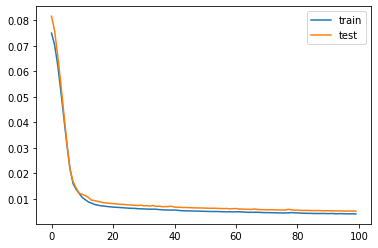

In [ ]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

Nous remarquons que notre fonction de perte (MSE) est très basse ce qui est un 
indicateur d'une bonne reconstitution des images. Etant donné que plus celle-ci se rapproche de 0, meilleure elle est, val_loss et loss attestent d'une bonne qualité. Les deux courbes stagnent et tendent vers un même point sans trop de variation pour la courbe test, ce qui indique que notre modèle n'est pas dans un cas de sur ou sous apprentissage.

Nous pouvons faire jouer avec la valeur des époques et la taille du batch afin de commencer d'ors et déjà à optimiser l'entrainement du modèle comme ci-dessous où nous avons fait varier l'optimiseur également afin d'attester de la performance de ce dernier et de jauger son impact.

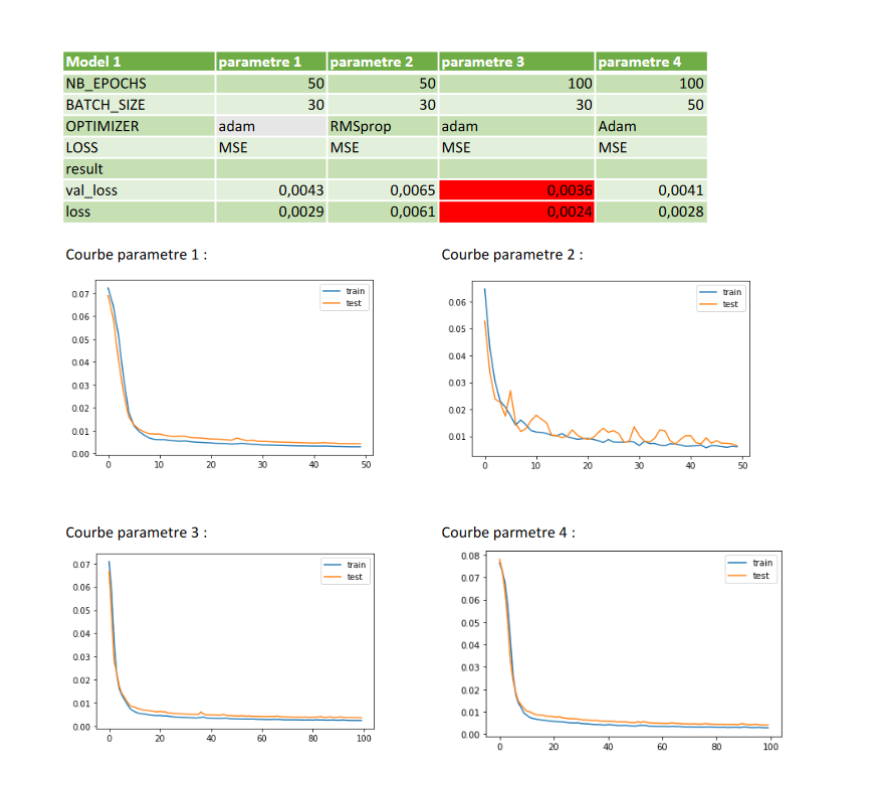



In [ ]:
import matplotlib.pyplot as plt

def display_image(X, n):
    plt.figure(figsize=(20, 5))
    for i in range(1, n + 1):
        ax = plt.subplot(1, n, i)
        plt.imshow(X[i])
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

In [ ]:
prediction = autoencoder.predict(x_test)

1/1 [==============================] - 0s 206ms/step


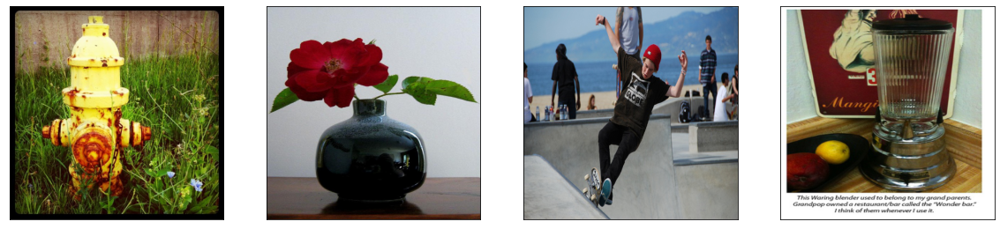

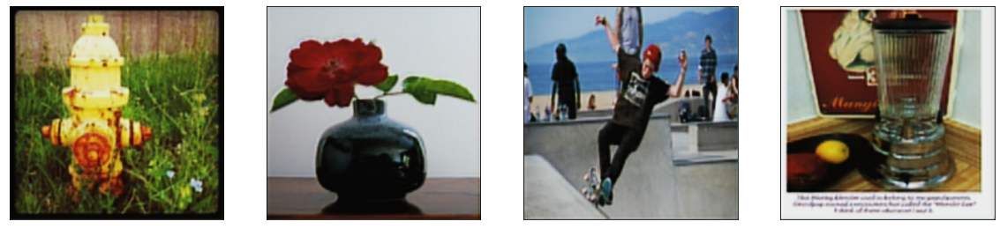

In [ ]:
display_image(x_test,4)
display_image(prediction,4)

Il est difficile de juger visuellement de la qualité des images prédites, car elles peuvent être floues pour notre oeil humain mais le but premier ici est l'accentuation de traits importants pour que le modèle puisse ensuite en extraire des informations. Ici, malgré tout, nous observons des images de bonne qualité avec des couleurs fidèles et des caractéristiques reconnaissables

L'étape suivante est d'abaisser autant que possible la valeur retournée par la fonction de loss.

#Data augmentation

L'augmentation des données est un processus d'augmentation artificiel de la quantité de données en générant de nouvelles données à partir de données existantes. 
Nous allons donc créer des dérivées d'images originales avec des transformations géométriques (telles que le retournement, la translation, la rotation) afin d'augmenter la diversité de l'ensemble d'apprentissage.

Nous avons donc rajouté dans notre modèle les couches :

*   RandomFlip : une couche qui permet de retourner les images de manière aléatoire pendant l'entrainement.
*   RandomRotation : une couche qui fait pivoter les images de manière aléatoire pendant l'entraînement.
*   RandomZoom : Une couche qui zoome de manière aléatoire sur les images pendant l'entraînement.


In [ ]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, RandomFlip, RandomRotation, RandomZoom
model_with_data_augmentation = keras.Sequential(
  [
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom((0, -0.5)),
  ]
)

In [ ]:
x_train = np.concatenate((x_train, model_with_data_augmentation(x_train)), axis=0)
len(x_train)

240

#Ajout de bruit

Apres plusieurs recherches, nous avons trouvé un moyen de vérifier la qualité des images à l'aide BRISQUE. 
Le score Brisque permet de mesurer la qualité d'une image de scène dites "naturelle". Il compare les images à un modèle par défaut calculé à partir d'images de scènes statiques avec des distorsions similaires. 
Plus le score est petit, plus il indique une meilleure qualité perceptuelle de l'image, il varie de 0 à 100.

In [ ]:
!pip install BRISQUE

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 135 kB 15.5 MB/s 
     |████████████████████████████████| 170 kB 53.4 MB/s 
  Created wheel for libsvm: filename=libsvm-3.23.0.4-cp37-cp37m-linux_x86_64.whl size=233361 sha256=55b23b921a5c3b71d9343f0f79b3f30cb0183532c2f471a030a5e8230883964e
  Stored in directory: /root/.cache/pip/wheels/cd/e8/1e/bf95cf256e4d3ffc94289ab508c49d48e34c98220af63e3513
Successfully built libsvm


In [ ]:
from brisque import BRISQUE
import PIL.Image
import os

#CALCUL SCORE BRISQUE
arrayQuality = []
for x in os.listdir(mypath):
    if x.endswith(".jpg"):
        obj = BRISQUE(mypath+"/"+x, url=False)
        arrayQuality.append(obj.score())
        
arrayQuality = np.clip(np.array(arrayQuality), 0, None)
maxQ = np.amax(arrayQuality)
print("Le score de l'image de moins bonne qualité : " + str(maxQ))
minQ = np.amin(arrayQuality)
print("Le score de l'image de meilleure qualité (ramené à 0) : " + str(minQ))
meanQ = sum(arrayQuality) / len(arrayQuality)
print("Le score moyen du dataset est : " + str(meanQ))

Le score de l'image de moins bonne qualité : 97.61242252130066
Le score de l'image de meilleure qualité (ramené à 0) : 70.5056678797159
Le score moyen du dataset est : 76.84525351254976


Le score moyen de qualité des images pour le dataset du livrable 2 est de 16,5. L'image avec la plus mauvaise qualité à un score de 87,7 et celle avec la meilleure qualité est de 0. Le modèle doit savoir traiter tout type d'image. C'est pourquoi nous allons réduire la qualité de notre dataset en ajoutant du bruit afin d'avoir un dataset plus représentatif, et par consequent, pouvoir entrainer le modèle à traiter les images avec plus de bruits.

Nous devons ajouter du bruit sur nos images. Cela va permettre à notre modèle de s'entrainer sur plus de données bruitées et donc de mieux debruiter les images de notre Dataset. Car actuellement notre modèle ne s'entraine que sur des données de bonne qualité alors qu'il doit savoir debruiter une image plus bruitée que la moyenne.

In [ ]:
noise_factor = 0.3
x_train_noisy = x_train + noise_factor * np.random.normal(loc=0.0, scale=0.7, size=x_train.shape)

x_test_noisy = x_test + noise_factor * np.random.normal(loc=0.0, scale=0.7, size=x_test.shape)


x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

In [ ]:
print(type(x_train))
print(type(x_test_blurred))

<class 'numpy.ndarray'>
<class 'list'>


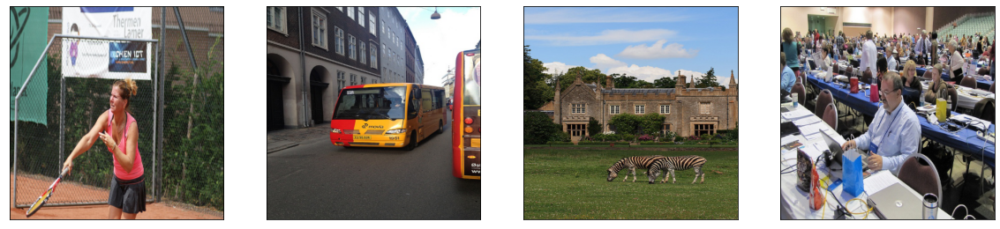

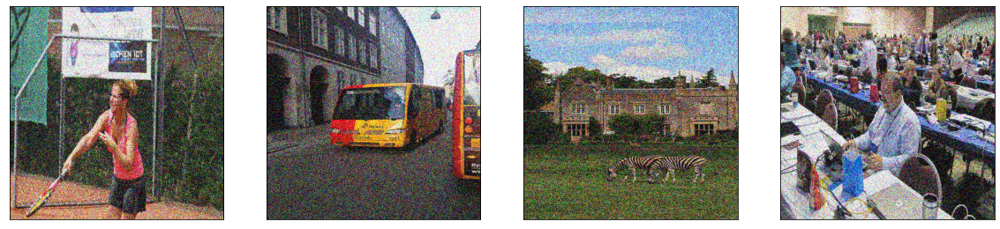

240


240

In [ ]:
display_image(x_train, n=4)  
display_image(x_train_noisy, n=4)  
print(len(x_train))
#len(x_train_blurred)
len(x_train_noisy)

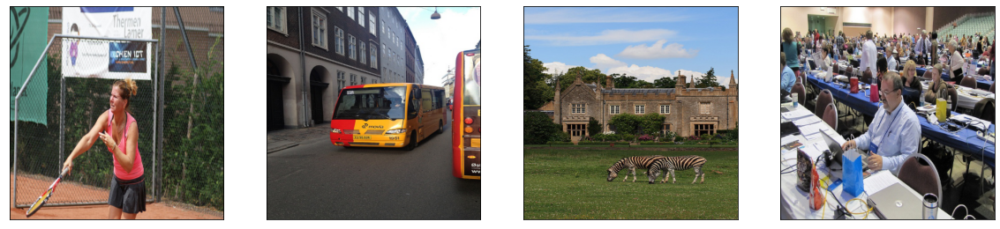

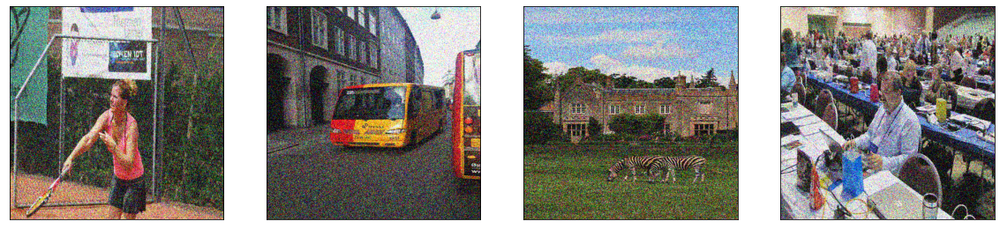

240

In [ ]:
#display_image(x_train, n=4)  
#display_image(x_train_noisy, n=4)  
len(x_train_noisy)

# DAE

Nous allons reprendre le modèle précédent et observer ses résultats avec les images bruitées en entrée.

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 conv2d_13 (Conv2D)          (None, 400, 400, 64)      1792      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 200, 200, 64)     0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 200, 200, 32)      18464     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 100, 100, 32)     0         
 2D)                                                             
                                                                 
 conv2d_15 (Conv2D)          (None, 100, 100, 32)      4128

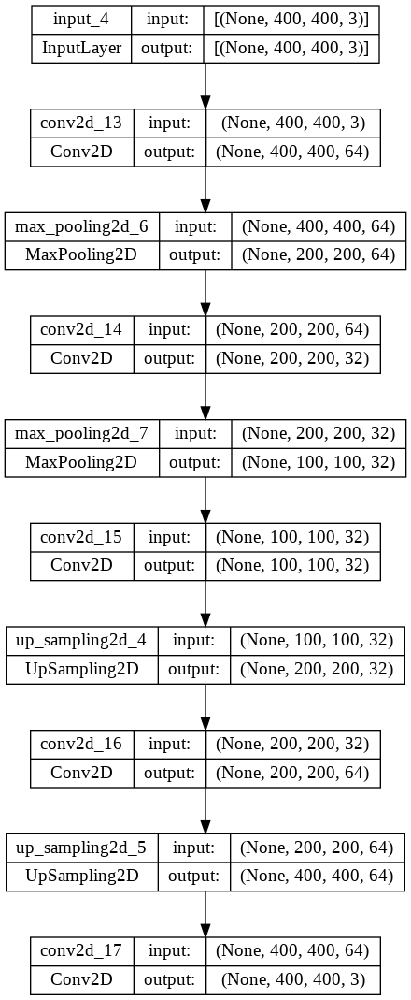

In [ ]:
#En Cours
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.utils.vis_utils import plot_model
from keras.models import Model


inputShape = Input(shape=(heightMean,widthMean,3))


# Encoder
x = Conv2D(64, (3, 3), activation="relu", padding="same")(inputShape)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = Conv2D(32, (2,2), activation='relu', padding='same')(x)
x = UpSampling2D((2,2))(x)
x = Conv2D(64, (3,3), activation="relu", padding ='same')(x)
x = UpSampling2D((2,2))(x)
x = Conv2D(3, (3, 3), activation= "sigmoid", padding="same")(x)

# Autoencoder
autoencoder_noisy_up = Model(inputShape, x)
autoencoder_noisy_up.compile(loss='mean_squared_error', optimizer = 'adam')
autoencoder_noisy_up.summary()
plot_model(autoencoder_noisy_up, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Configurations principales de nos modèles
NB_EPOCHS_DENOISE = 100              # nombre epoch alogithme debruiter
BATCH_SIZE        = 30               # taille batch de traitement
SAV_MODEL_DENOISE = "denoiser.h5"     # sauvegarde du modele de debruitage


history = autoencoder_noisy_up.fit(x_train_noisy, x_train, #cross validation 
                epochs= NB_EPOCHS_DENOISE,
                batch_size= BATCH_SIZE,
                shuffle=True, 
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)],
                )

Epoch 1/100
8/8 [==============================] - 6s 485ms/step - loss: 0.0672 - val_loss: 0.0582
Epoch 2/100
8/8 [==============================] - 4s 443ms/step - loss: 0.0284 - val_loss: 0.0229
Epoch 3/100
8/8 [==============================] - 4s 451ms/step - loss: 0.0182 - val_loss: 0.0171
Epoch 4/100
8/8 [==============================] - 4s 462ms/step - loss: 0.0136 - val_loss: 0.0165
Epoch 5/100
8/8 [==============================] - 4s 449ms/step - loss: 0.0114 - val_loss: 0.0134
Epoch 6/100
8/8 [==============================] - 4s 461ms/step - loss: 0.0086 - val_loss: 0.0103
Epoch 7/100
8/8 [==============================] - 3s 440ms/step - loss: 0.0070 - val_loss: 0.0097
Epoch 8/100
8/8 [==============================] - 4s 454ms/step - loss: 0.0067 - val_loss: 0.0092
Epoch 9/100
8/8 [==============================] - 4s 459ms/step - loss: 0.0063 - val_loss: 0.0086
Epoch 10/100
8/8 [==============================] - 4s 446ms/step - loss: 0.0060 - val_loss: 0.0089
Epoch 11/

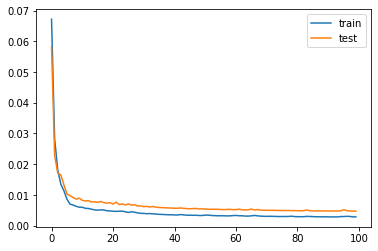

In [ ]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

Ici, la courbe ne justifie aucun sur ou sous apprentissage. Nous observons que la loss et la val_loss du modèle DAE sont inférieures que le modèle AE (1) ce qui confirme une meilleure performance de ce nouveau modèle.

1/1 [==============================] - 0s 122ms/step


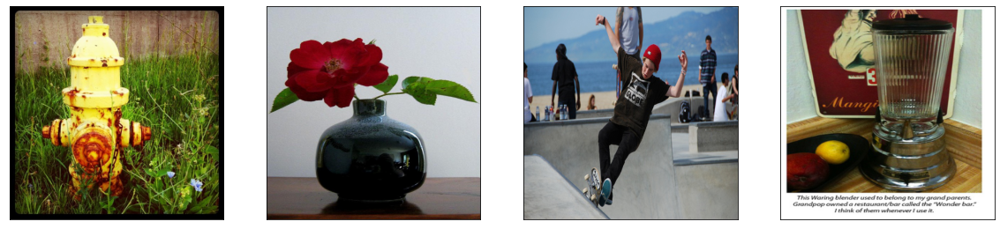

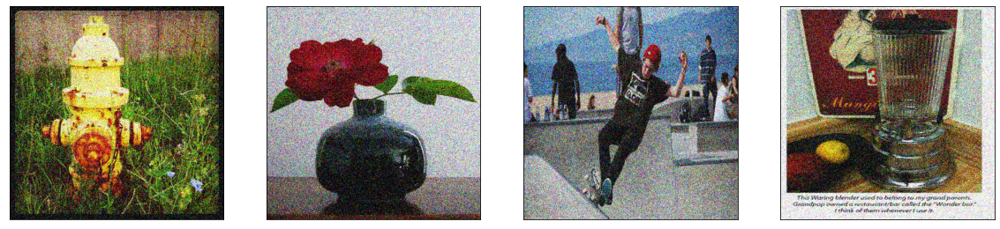

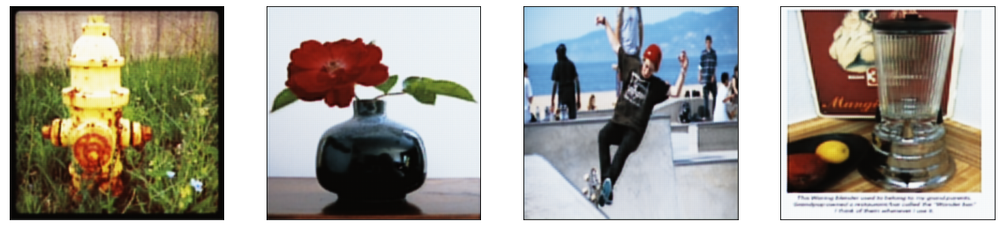

In [ ]:
prediction = autoencoder_noisy.predict(x_test)
display_image(x_test,4)
display_image(x_test_noisy,4)
display_image(prediction,4)

Afin d'améliorer le decodeur, nous allons changer de couche et utiliser Conv2DTranspose qui effectue une opération de convolution inverse. C'est à dire que lorsqu'il va augmenter la largeur et longueur de la matrice, la valeur des nouveaux pixels sera 0.

Conv2DTranspose est recommandé par Keras pour le DAE. 

[source](https://keras.io/examples/vision/autoencoder/)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 400, 400, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 200, 200, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 32)      18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 100, 100, 32)     0         
 2D)                                                             
                                                                 
 conv2d_transpose (Conv2DTra  (None, 200, 200, 32)     9248  

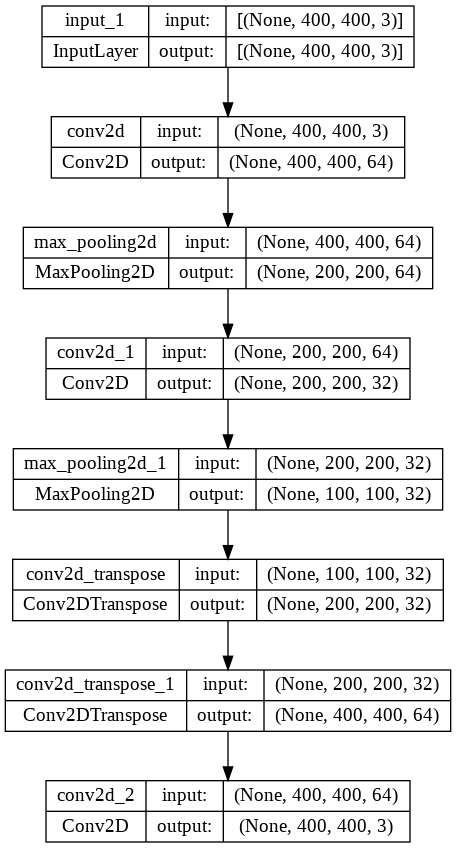

In [ ]:
#En Cours
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.utils.vis_utils import plot_model
from keras.models import Model


inputShape = Input(shape=(heightMean,widthMean,3))


# Encoder
x = Conv2D(64, (3, 3), activation="relu", padding="same")(inputShape)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = tf.keras.layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=2, activation="relu", padding="same")(x)
x = Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

# Autoencoder
autoencoder_noisy = Model(inputShape, x)
autoencoder_noisy.compile(loss='mean_squared_error', optimizer = 'adam')
autoencoder_noisy.summary()
plot_model(autoencoder_noisy, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Configurations principales de nos modèles
NB_EPOCHS_DENOISE = 100              # nombre epoch alogithme debruiter
BATCH_SIZE        = 30               # taille batch de traitement
SAV_MODEL_DENOISE = "denoiser.h5"     # sauvegarde du modele de debruitage


history = autoencoder_noisy.fit(x_train_noisy, x_train, #cross validation 
                epochs= NB_EPOCHS_DENOISE,
                batch_size= BATCH_SIZE,
                shuffle=True, 
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)],
                )

Epoch 1/100
8/8 [==============================] - 17s 585ms/step - loss: 0.0735 - val_loss: 0.0823
Epoch 2/100
8/8 [==============================] - 4s 544ms/step - loss: 0.0644 - val_loss: 0.0630
Epoch 3/100
8/8 [==============================] - 4s 560ms/step - loss: 0.0366 - val_loss: 0.0271
Epoch 4/100
8/8 [==============================] - 5s 569ms/step - loss: 0.0211 - val_loss: 0.0222
Epoch 5/100
8/8 [==============================] - 4s 565ms/step - loss: 0.0160 - val_loss: 0.0181
Epoch 6/100
8/8 [==============================] - 4s 552ms/step - loss: 0.0135 - val_loss: 0.0154
Epoch 7/100
8/8 [==============================] - 5s 568ms/step - loss: 0.0124 - val_loss: 0.0148
Epoch 8/100
8/8 [==============================] - 5s 569ms/step - loss: 0.0118 - val_loss: 0.0142
Epoch 9/100
8/8 [==============================] - 4s 565ms/step - loss: 0.0114 - val_loss: 0.0133
Epoch 10/100
8/8 [==============================] - 4s 555ms/step - loss: 0.0111 - val_loss: 0.0135
Epoch 11

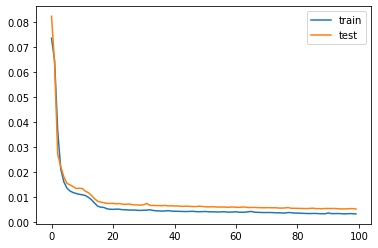

In [ ]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

Encore une fois, la courbe ne montre aucun signe de sur ou sous apprentissage et atteste au contraire que le modèle est performant sur les échantillons d'entrainement comme sur les échantillons de tests. Pour autant, on observe une valeur de loss et val_loss supérieure au précédent modèle. 

1/1 [==============================] - 0s 129ms/step


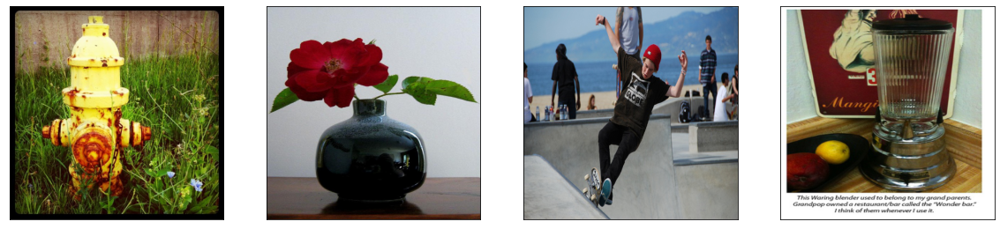

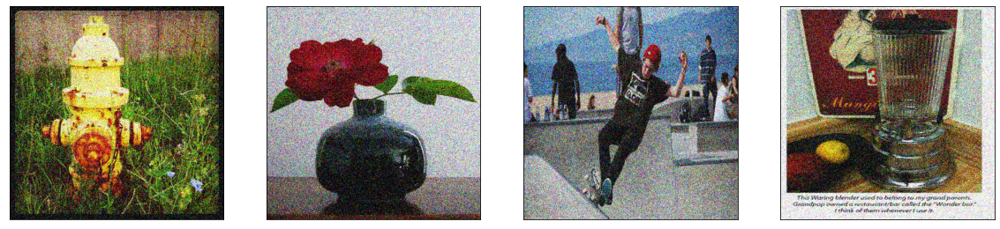

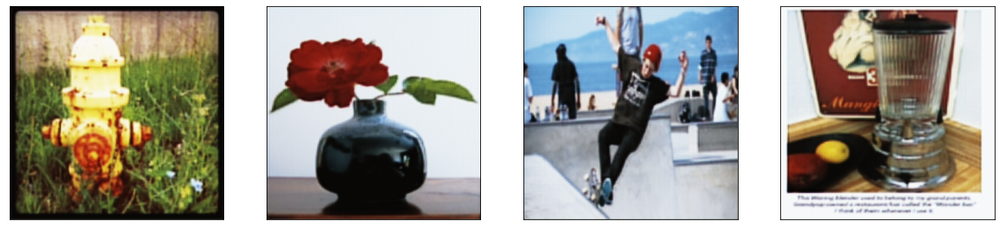

In [ ]:
prediction = autoencoder_noisy.predict(x_test)
display_image(x_test,4)
display_image(x_test_noisy,4)
display_image(prediction,4)

Etant donné que notre but est d'avoir la plus petite loss possible, nous décidons de garder le premier modèle et de l'améliorer à l'aide du Tuner.

#Tuner 

Keras Tuner va nous permettre de nous donner les valeurs des hyperparamètres parmi notre sélection, afin d'obtenir le plus optimisé des modèles. Il va entrainer notre modèle Keras de DAE avec toutes les combinaisons possibles d'hyperparamètres sélectionnés et comparer la valeur de perte, ici le MSE, sur la partie validation et nous retourner quels sont les hyperparamètres à entrer.

Ici, nous allons faire varier le nombre de couches, la densité de chaque couche ainsi que le nombre de fois qu'on dédouble la couche de convolution. Multipler le conv2D, d'après [ce site](https://www.kaggle.com/code/alisharifi2000/autoencoder-gpu/notebook?scriptVersionId=57087812), permettrait d'améliorer la  performance. Grace à ce Keras Tuner, si cela a un réel impact positif, il nous retournera combien de multiple faut-il avoir.


Nous utiliserons toujours MSE en tant que fonction de perte.


On ne peut avoir un nombre de couche illimtée, car à chaque MaxPooling, la largeur et longueur de l'image est divisée par deux. Or, si on entre une forme d'entrée de 300x300x3, après 3 opérations de MaxPooling2D, celle-ci sera réduite à 37,5. Cette valeur sera arrondie et lors du UpSampling, nous perdrons des pixels, ce qui aura comme répercussion d'avoir une forme d'entrée différente de la forme de sortie.

Nous ne surchagerons pas le keras tuner pour des questions de performances, en choisissant des valeurs populaires et une quantité moindre. Le nombre d'époque est réduit à 50 pour une durée de chargement réduite.

In [ ]:
pip install keras-tuner 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 135 kB 27.0 MB/s 
     |████████████████████████████████| 1.6 MB 44.5 MB/s 


In [ ]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
import keras_tuner as kt

def create_model(hp):
    inputShape = Input(shape=(heightMean,widthMean,3))
    nb_couches = hp.Choice('nb_couches',values=[1,2,3])
    nb_neurones =  hp.Choice('nb_neurones',values=[16,32,64])
    nb_multiple = hp.Choice('nb_multiple',values=[1,2,3])

    x = inputShape
    for i in range(nb_couches):
        for o in range(nb_multiple):
            x = Conv2D((nb_neurones/(i+1)), (3, 3), activation="relu", padding="same")(x)
        x = MaxPooling2D((2, 2), padding="same")(x)

    for i in range(nb_couches, 0, -1):
        for o in range(nb_multiple):
          x = Conv2D((nb_neurones/(i+1)), (2,2), activation='relu', padding='same')(x)
        x = UpSampling2D((2,2))(x)

    x = Conv2D(3, (3, 3), activation="relu", padding="same")(x)

    # Autoencoder
    autoencoder = Model(inputShape, x)
    autoencoder.compile(optimizer = "adam", loss = "mean_squared_error")
    autoencoder.summary()
    
    return autoencoder

In [ ]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
import keras_tuner as kt

tuner = kt.RandomSearch(
    create_model,
    objective='val_loss',
    executions_per_trial=1,
    overwrite = True
)

tuner.search(x_train_noisy, x_train,
  epochs= 50,
  batch_size= 30,
  shuffle=True, 
  validation_data=(x_test_noisy, x_test),
)

tuner.results_summary()

Trial 1 Complete [00h 03m 39s]
val_loss: 0.007136071566492319

Best val_loss So Far: 0.007136071566492319
Total elapsed time: 00h 03m 39s

Search: Running Trial #2

Value             |Best Value So Far |Hyperparameter
1                 |2                 |nb_couches
128               |32                |nb_neurones
2                 |2                 |nb_multiple

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 400, 400, 128)     3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 400, 400, 128)     147584    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 200, 200, 128)    0         
 )                     

ResourceExhaustedError: ignored

Visiblement, 1 couche de 64 neurones multiplié 3 fois permettrait d'avoir une meilleure retranscription de l'image débruitée. Nous avions un doute sur l'efficacité de la multiplication d'une couche. Or, ici, le modèle ayant 1 couche de 64 neurones sans multiplication arrive en 3è position.

La dernière étape sera d'entrainer le modèle retourné par Keras Tuner sur notre Dataset et enfin vérifier les prédictions

# Entrainement final et Prédiction finale.


Nous injectons au modèle envoyé au Tuner, les hyperparamètres retournés par le Tuner mais avec un nombre d'époque remis à 100 comme recommandé.

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 400, 400, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 400, 400, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 200, 200, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 200, 200, 32)      18464     
                                                                 
 conv2d_3 (Conv2D)           (None, 200, 200, 32)      9248      
                                                             

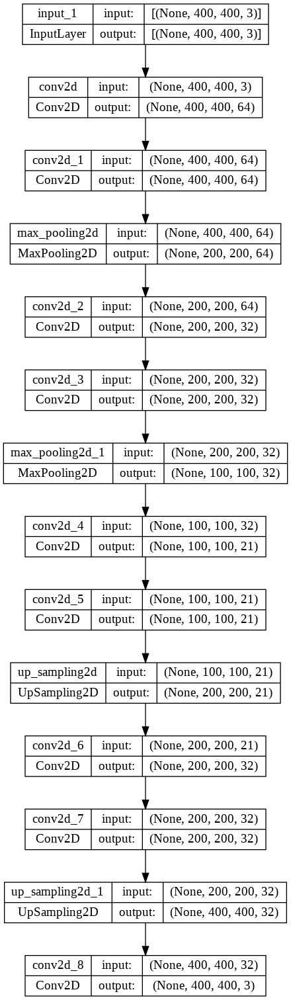

In [ ]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras.utils.vis_utils import plot_model

inputShape = Input(shape=(heightMean,widthMean,3))
nb_couches = 2
nb_neurones =  64 
nb_multiple = 2

x = inputShape
for i in range(nb_couches):
    for o in range(nb_multiple):
        x = Conv2D((nb_neurones/(i+1)), (3, 3), activation="relu", padding="same")(x)
    x = MaxPooling2D((2, 2), padding="same")(x)

for i in range(nb_couches, 0, -1):
    for o in range(nb_multiple):
      x = Conv2D((nb_neurones/(i+1)), (2,2), activation='relu', padding='same')(x)
    x = UpSampling2D((2,2))(x)

x = Conv2D(3, (3, 3), activation="relu", padding="same")(x)

# Autoencoder
autoencoder_final = Model(inputShape, x)
autoencoder_final.compile(optimizer = "adam", loss = "mean_squared_error")
autoencoder_final.summary()
plot_model(autoencoder_final, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Configurations principales de nos modèles
NB_EPOCHS_DENOISE = 100              # nombre epoch alogithme debruiter
BATCH_SIZE        = 32               # taille batch de traitement
SAV_MODEL_DENOISE = "denoiser.h5"     # sauvegarde du modele de debruitage


history = autoencoder_final.fit(x_train_noisy, x_train, #cross validation 
                epochs= NB_EPOCHS_DENOISE,
                batch_size= BATCH_SIZE,
                shuffle=True, 
                validation_data=(x_test_noisy, x_test),
                callbacks=[tf.keras.callbacks.TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)],
                )

Epoch 1/100
8/8 [==============================] - 28s 2s/step - loss: 0.2264 - val_loss: 0.1798
Epoch 2/100
8/8 [==============================] - 6s 692ms/step - loss: 0.1304 - val_loss: 0.1156
Epoch 3/100
8/8 [==============================] - 6s 703ms/step - loss: 0.1128 - val_loss: 0.1163
Epoch 4/100
8/8 [==============================] - 6s 697ms/step - loss: 0.1064 - val_loss: 0.1007
Epoch 5/100
8/8 [==============================] - 6s 698ms/step - loss: 0.0513 - val_loss: 0.0287
Epoch 6/100
8/8 [==============================] - 6s 694ms/step - loss: 0.0245 - val_loss: 0.0206
Epoch 7/100
8/8 [==============================] - 6s 709ms/step - loss: 0.0163 - val_loss: 0.0185
Epoch 8/100
8/8 [==============================] - 6s 711ms/step - loss: 0.0152 - val_loss: 0.0164
Epoch 9/100
8/8 [==============================] - 6s 710ms/step - loss: 0.0136 - val_loss: 0.0159
Epoch 10/100
8/8 [==============================] - 6s 714ms/step - loss: 0.0129 - val_loss: 0.0145
Epoch 11/10

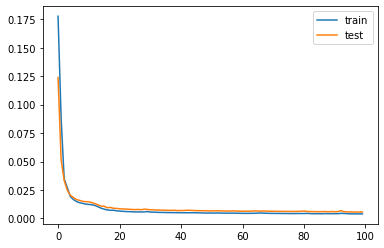

In [ ]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()

Ici, la courbe ne signale rien d'anormal, voire montre des performances presques parfaites. Une fonction de perte aux valeurs très proche de zero et une courbe qui stagne.

1/1 [==============================] - 0s 151ms/step


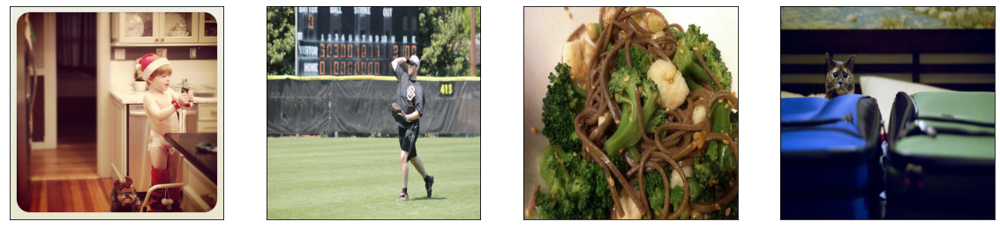

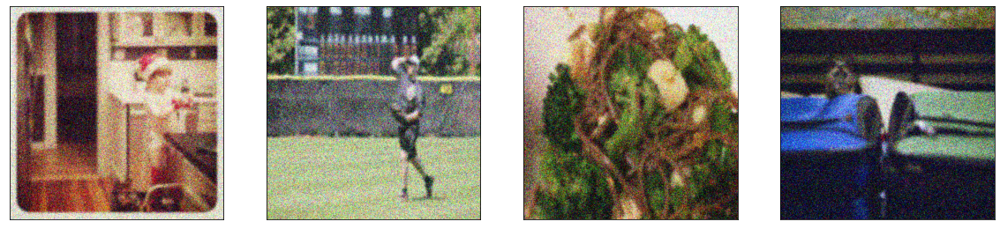

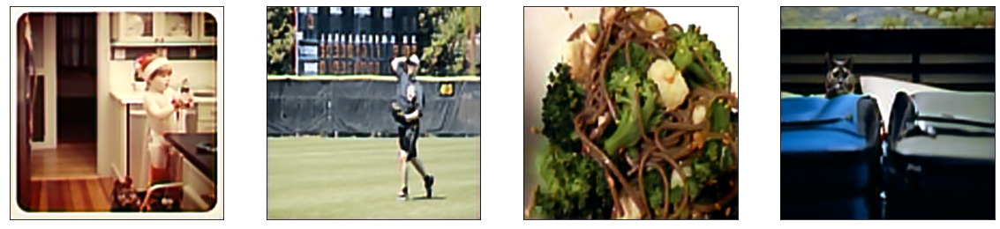

In [ ]:
prediction = autoencoder_final.predict(x_test)
display_image(x_test,4)
display_image(x_test_noisy,4)
display_image(prediction,4)

Finalement, il est important d'évaluer les prédictions sur le dataset de test. Pour cela nous allons utiliser le moyen de mesure d'erreur DSSIM, utilisant SSIM (Structural Similarity Index Measure).

L'idée de SSIM est de mesurer la similarité de structure entre les deux images, plutôt qu'une différence pixel à pixel. SSIM se compose de 3 parties liées à la similitude de la luminance (intensité des pixels), de la structure et du contraste. SSIM est calculé pour des patchs p, q de taille KxK (K est un nombre impair supérieur à 1) extraits de toute l'image. En centrant la fenêtre glissante sur des pixels successifs, on obtient une erreur de reconstruction pour chaque pixel.

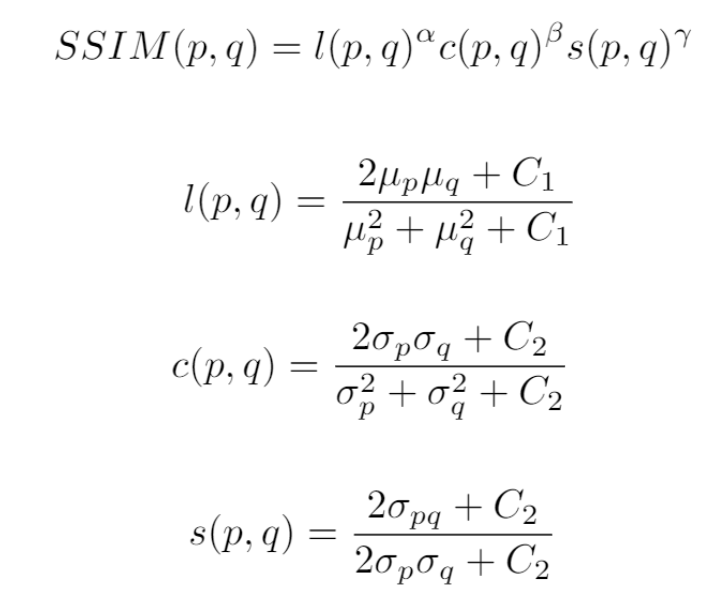

Les valeurs de SSIM sont comprises entre -1 et 1.
Plus le resultat de DSSIM se rapproche de 0, plus les photos sont similaires.






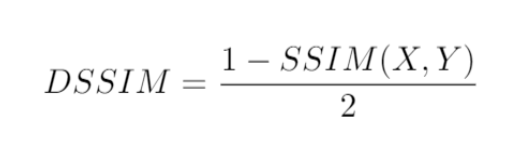

In [ ]:
def DSSIM_loss(y_true, y_pred):
  return 1/2 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, 1.0))/2

Dans un premier temps, nous vérifions la valeur de DSSIM entre les images bruitées et les images originales pour avoir un point de référence

In [ ]:
DSSIM_loss(x_test.astype('double'),x_test_noisy.astype('double'))

<tf.Tensor: shape=(), dtype=float32, numpy=0.46061265>

Maintenant, nous vérifions si la valeur de DSSIM entre les images originales et les images débruitées est inférieure, dans ce cas là, cela signifierait que les images sont plus fidèles et donc de meilleure qualité.

In [ ]:
DSSIM_loss(x_test.astype('double'),prediction.astype('double'))

<tf.Tensor: shape=(), dtype=float32, numpy=0.20797917>

On retrouve bien une valeur inférieure pour nos images débruitées.

In [ ]:
autoencoder_final.save_weights('./autoencoder')

On remarque quand même qu'il reste du bruit léger sur les images après leur passage dans le modèle. La meilleure option resterait de : 


*   Re mesurer leur qualité avec BRISQUE
*   Tenter de réduire le flou avec les filtres laplacien qui aident à détecter les contours.
*   Entrainer notre modèle sur le dataset du livrable 1 (plus grand dataset), comme il nous est demandé de traiter les images du dataset fournit pour le livrable 2.




